# EDA

![](https://www.asofterworld.com/clean/fireescape.jpg)

## Client "Amy Williams" (Mafiosi/Seller)

Our client needs to sell central top 10% houses to make "clean" money, and needs to keep the average houses in the outskirts to use them as safe houses when needed.

#### Hypothesis 1:  
It might draw too much attention selling the fancy central objects this year.
* sales trend in past years, are this year's sales significantly lower?

#### Hypothesis 2:  
It might draw too much attention selling the fancy central objects in certain seasons (e.g. winter) of the year
* The number of sales is significantly higher for 1 or more specific seasons?

#### Hypothesis 3: 
It might draw too much attention selling coastline objects where the client might have used the water as an alternative recycling method for biodegradable "waste"
* overall sales trend of waterfront objects in the past years - the newer the date, the less sales?

#### Hypothesis 4: 
It might draw attention to sell fancy central houses and NOT sell the average ones in the outskirts
* Sales of average houses in the outskirts are higher than those of top 10% quality houses in city center?

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
df_import = pd.read_csv('data/eda.csv')
df_import.head(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,...,0.000,1955,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000
1,6414100192,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,...,400.000,1951,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000
2,5631500400,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,...,0.000,1933,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000
3,2487200875,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,...,910.000,1965,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000
4,1954400510,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,...,0.000,1987,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000
5,7237550310,4.000,4.500,5420.000,101930.000,1.000,0.000,0.000,3,11,...,1530.000,2001,0.000,98053,47.656,-122.005,4760.000,101930.000,2014-05-12,1230000.000
6,1321400060,3.000,2.250,1715.000,6819.000,2.000,0.000,0.000,3,7,...,NaN,1995,0.000,98003,47.310,-122.327,2238.000,6819.000,2014-06-27,257500.000
7,2008000270,3.000,1.500,1060.000,9711.000,1.000,0.000,NaN,3,7,...,0.000,1963,0.000,98198,47.410,-122.315,1650.000,9711.000,2015-01-15,291850.000
8,2414600126,3.000,1.000,1780.000,7470.000,1.000,0.000,0.000,3,7,...,730.000,1960,0.000,98146,47.512,-122.337,1780.000,8113.000,2015-04-15,229500.000
9,3793500160,3.000,2.500,1890.000,6560.000,2.000,0.000,0.000,3,7,...,0.000,2003,0.000,98038,47.368,-122.031,2390.000,7570.000,2015-03-12,323000.000


### The Variables:

According to [public info on the dataset](https://rstudio-pubs-static.s3.amazonaws.com/155304_cc51f448116744069664b35e7762999f.html):

* __id__: Unique ID for each home sold
* __date__: Date of the home sale
* __price__: Price of each home sold
* __bedrooms__: Number of bedrooms
* __bathrooms__: Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* __sqft_living__: Square footage of the apartments interior living space
* __sqft_lot__: Square footage of the land space
* __floors__: Number of floors
* __waterfront__: A dummy variable for whether the apartment was overlooking the waterfront or not
* __view__: An index from 0 to 4 of how good the view of the property was
* __condition__: An index from 1 to 5 on the condition of the apartment,
* __grade__: An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* __sqft_above__: The square footage of the interior housing space that is above ground level
* __sqft_basement__: The square footage of the interior housing space that is below ground level
* __yr_built__: The year the house was initially built
* __yr_renovated__: The year of the house’s last renovation
* __zipcode__: What zipcode area the house is in
* __lat__: Lattitude
* __long__: Longitude
* __sqft_living15__: The square footage of interior housing living space for the nearest 15 neighbors
* __sqft_lot15__: The square footage of the land lots of the nearest 15 neighbors



In [3]:
import plotly.graph_objects as go
import plotly.express as px

# Create a sample map
fig = px.scatter_geo(df_import, lon='long', lat='lat', hover_name='id',color="price", color_continuous_scale=["skyblue", "red"])

# Update layout to focus on King County
fig.update_layout(title='King County Home Prices',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show()

In [4]:
# df_import.shape # (21597, 21)
df_import.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

### Cleaning & Transforming the Data

#### Overall checks

In [5]:
# Check for duplicates:
df_import.duplicated().value_counts() # False    21597 (all good)

False    21597
Name: count, dtype: int64

<Axes: >

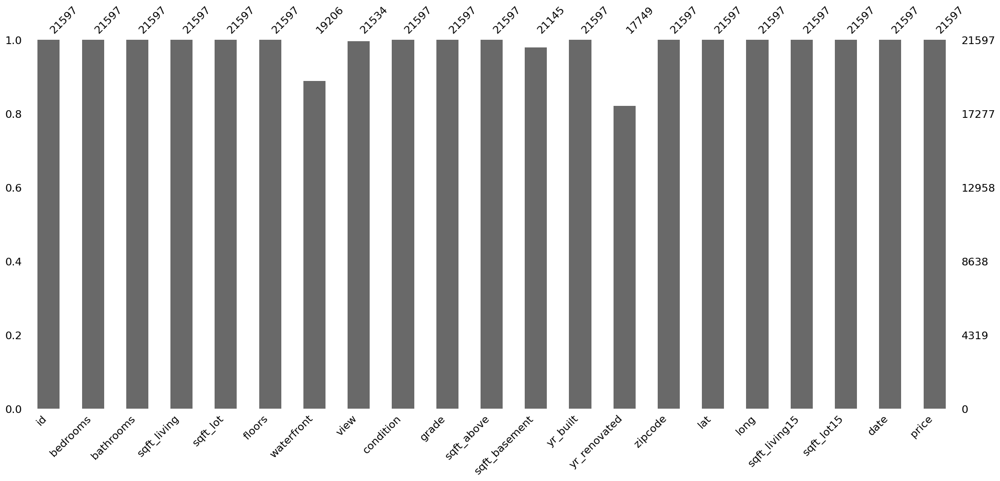

In [6]:
# Check for missing data
import missingno as msno
df_import.isna().sum() 
# yr_renovated & waterfront have a LOT of missing entries, while sqft_basement has 452 (incl. no basement?)
# df_import[df_import['sqft_basement'] == 0].count()

msno.bar(df_import)

#### 'sqft_price' (new column)

In [7]:
# Calculate the price/sqft_living:
df_import['sqft_price'] = df_import['price']/df_import['sqft_living']

In [8]:
# Let's look at the price heatmap again, this time accounting for the sqft-area:
fig = px.scatter_geo(df_import, lon='long', lat='lat', hover_name='id',color="sqft_price", color_continuous_scale=["skyblue", "red"])

# Update layout to focus on King County
fig.update_layout(title='King County Home Prices',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() # And now the county looks more expensive (because we accounted for the sqft_living when comparing prices)

In [24]:
fig = px.scatter_geo(df_import[df_import['waterfront'] == 0], lon='long', lat='lat', hover_name='id',color='sqft_price')

# Update layout to focus on King County
fig.update_layout(title='King County Home non-Waterfront Houses',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 

#### 'sqft_basement'

In [25]:
df_import.sqft_basement.median() # 0.00
df_import.sqft_basement.mode() # 0.00
df_import.sqft_basement.mean() # np.float64(291.8572239300071)
px.box(df_import['sqft_basement']) # Welp...

In [26]:
px.scatter(df_import, x='floors', y='sqft_basement') 

# This makes little to no sense
# Also because of all the half-floors counting as categories of their own, making the comparison difficult

In [27]:
px.histogram(df_import, x='floors', y='sqft_basement', nbins=4) 

# The higher the building, the smaller the basement?

In [28]:
px.scatter(df_import, x='sqft_basement', y='sqft_above') 

# The straight line is houses where sqft_basement = sqft_above
# So logically, most houses have sqft_above > sqft_basement, rarely vice versa

In [29]:
px.scatter(df_import, x='sqft_living', y='sqft_above') 

# Here we finally see something clear: The straight line of houses with no basement

In [31]:
df_import[df_import['sqft_above'] == df_import['sqft_living']].sqft_basement.unique() # array([ 0., nan])

# Does this mean that the missing data in sqft_basement are all meant to be = 0?

df_import[df_import['sqft_above'] != df_import['sqft_living']].sqft_basement.min() # np.float64(10.0)
df_import[df_import['sqft_above'] != df_import['sqft_living']].sqft_basement.isna().sum() # np.int64(169)
# ===> All but 169 houses, where we really don't know how large the basement is.

# Replace the missing data for basements in houses where sqft_living = sqft_above with 0:
df_import.loc[df_import['sqft_above'] == df_import['sqft_living'], 'sqft_basement'] = 0


#### 'date'

In [16]:

# The column 'date' has the data type "object", so we need to turn the values into proper dates:
type(df_import['date'][0]) # type of 1st observation in 'date' column is str

# from a look at the data frame head we saw that the date format is %Y-%m-%d
df_import['date'] = pd.to_datetime(df_import['date'], format='%Y-%m-%d')
df_import.head(10)
type(df_import['date'][0]) # pandas._libs.tslibs.timestamps.Timestamp


pandas._libs.tslibs.timestamps.Timestamp

#### 'view'

In [17]:
# The column 'view' has mysterious values, including many missings. Let's have a look:
df_import.view.nunique() # 5 unique values
df_import.view.unique() # array([ 0., nan,  3.,  4.,  2.,  1.])
type(df_import['view'][0]) # numpy.float64

# Seems like this column is a 0-4 scale of how in-demand the house's view is
df_import[df_import['view'] == 4].sort_values(by='price', ascending=False).head(7)

# plot against the price:
fig = px.box(df_import, x='view', y='price')
fig.show()
# It does seem to be somewhat correlated to the price!

# But what about the missing values, might they include attractive objects?
# First replace the missing values with 0, and the 0-4 categories to 1-5:
df_import['view'] = df_import.view.replace(4, 5)
df_import['view'] = df_import.view.replace(3, 4)
df_import['view'] = df_import.view.replace(2, 3)
df_import['view'] = df_import.view.replace(1, 2)
df_import['view'] = df_import.view.replace(0, 1)
df_import['view'] = df_import.view.replace(np.nan, 0)
df_import.view.unique()

array([1., 0., 4., 5., 3., 2.])

In [18]:
# plot again against the price: 
# Now the observed rating of the view is on a 1-5 scale, and the missing data is coded 0
fig = px.box(df_import, x='view', y='price')
fig.show() # Now we can see the price distribution of houses with no view rating

#### 'waterfront'

In [19]:
waterfront_houses = df_import[df_import['waterfront'] == 1]

In [33]:
fig = px.scatter_geo(df_import[df_import['waterfront'] == 1], lon='long', lat='lat', hover_name='id',color='sqft_price')

# Update layout to focus on King County
fig.update_layout(title='King County Waterfront Properties',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() # As expected, homes with a waterfront tend to be on the higher end of the prices:

In [21]:
df_import.waterfront.isna().sum() # np.int64(2391)

np.int64(2391)

In [22]:
# Plot houses missing data in column 'waterfront':

waterfront_nan = df_import[df_import.waterfront.isna() == True]
fig = px.scatter_geo(waterfront_nan, lon='long', lat='lat', hover_name='id',color="sqft_price")

# Update layout to focus on King County
fig.update_layout(title='King County Homes (Waterfront info missing)',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 

In [23]:
# Plot houses with missing data in 'waterfront' but a good 'view' grade (>3)

fig = px.scatter_geo(waterfront_nan[waterfront_nan['view'] > 3], lon='long', lat='lat', hover_name='id',color="sqft_price")

# Update layout to focus on King County
fig.update_layout(title='King County Homes (Waterfront info missing, view rating > 3)',title_x=0.45,
    geo=dict(
        scope='usa',  # Use 'usa' scope for a broader region
        center=dict(lat=47.5, lon=-122.0),  # Center the map on King County
        projection_scale=6,  # Zoom level
        # Define the boundaries
        lataxis=dict(range=[42, 46]),
        lonaxis=dict(range=[-127, -119])
    )
)

fig.show() 